In [1]:
import os
import warnings
from datetime import datetime

import numpy as np
import xarray as xr
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches

import fsspec
import wradlib as wrl
import xradar as xd

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
from cartopy.feature import ShapelyFeature

import hvplot.xarray
import hvplot.pandas
import holoviews as hv
from holoviews.operation.datashader import rasterize
from bokeh.models import LinearColorMapper, ColorBar
import panel as pn
from shapely.geometry import box
from dask.distributed import Client, LocalCluster

hv.extension('bokeh')
pn.extension()
warnings.simplefilter('ignore')


In [2]:
cluster = LocalCluster(dashboard_address=":8789")
client = Client(cluster)

### Radar data

In [3]:
fs = fsspec.filesystem("s3", anon=True)
year = 2025
car_files =  ['s3://' + f for f in 
              sorted(fs.glob(f"s3-radaresideam/l2_data/{year}/04/02/Carimagua/CAR*"))
             ]
gua_files = ['s3://' + f for f in 
             sorted(fs.glob(f"s3-radaresideam/l2_data/{year}/04/02/Guaviare/GUA*"))
            ]
tab_files =  ['s3://' + f for f in 
              sorted(fs.glob(f"s3-radaresideam/l2_data/{year}/04/02/Tablazo/TAB*"))
             ]


In [4]:
def download_s3file(s3_path: str)-> str:
    return fsspec.open_local(
            f"simplecache::s3://{s3_path}",
            s3={"anon": True},
            filecache={"cache_storage": "."},
        )

In [5]:
dt_car = xd.io.open_iris_datatree(
        download_s3file(car_files[1553]),
        chunks={"azimuth": 360, "range": 497}
    )
dt_gua = xd.io.open_iris_datatree(
    download_s3file(gua_files[807]),
    chunks={"azimuth": 360, "range": 497}
)

In [6]:
ctree = xr.DataTree.from_dict(
    {
    "CAR": dt_car["sweep_0"].ds, 
    "GUA": dt_gua["sweep_0"].ds
    }
)

### Georeference, Quality Field and Rainrate Retrieval

In [7]:
proj_utm = wrl.georef.epsg_to_osr(4326)

In [8]:
%%time
for radar in ctree.children:
    print(radar)
    ctree[radar].ds = ctree[radar].ds.wrl.georef.georeference(crs=proj_utm)
    ctree[radar].ds = ctree[radar].ds.assign(
        QUAL=ctree[radar].ds.range.wrl.qual.pulse_volume(250.0, 0.9).expand_dims(
            azimuth=ctree[radar].ds.azimuth
        )
    )
    ra, si = ctree[radar].ds.DBZH.load().wrl.trafo.idecibel().wrl.zr.z_to_r_enhanced()
    ctree[radar].ds = ctree[radar].ds.assign(RAIN=ra)
    ctree[radar]["RAIN"] = ctree[radar].ds.RAIN.where(ctree[radar].ds.RAIN >= 0.05, other=0)

CAR
GUA
CPU times: user 2.27 s, sys: 162 ms, total: 2.43 s
Wall time: 7.1 s


#### Gridding

In [9]:
def bbox(*args):
    """Get bounding box from a set of radar bin coordinates"""
    xy = np.array(
        [
            [
                arg.x.min().values,
                arg.x.max().values,
                arg.y.min().values,
                arg.y.max().values,
            ]
            for arg in args
        ]
    )
    xmin = xy[..., 0].min()
    xmax = xy[..., 1].max()
    ymin = xy[..., 2].min()
    ymax = xy[..., 3].max()

    return xmin, xmax, ymin, ymax

In [10]:
resolution = 0.005  # ≈ 250 meters at the equator # meters (adjust to 300 or 500 if needed)

xmin, xmax, ymin, ymax = bbox(*[ctree[radar].ds for radar in ctree.children])

In [11]:

# Round the limits to full resolution steps
xmin = np.floor(xmin / resolution) * resolution
xmax = np.ceil(xmax / resolution) * resolution
ymin = np.floor(ymin / resolution) * resolution
ymax = np.ceil(ymax / resolution) * resolution

In [12]:
# Create evenly spaced grid
x = np.arange(xmin, xmax + resolution, resolution)
y = np.arange(ymin, ymax + resolution, resolution)

In [13]:
cart = xr.Dataset(coords={"x": (["x"], x), "y": (["y"], y)})

#### Grid using wradlib.comp.togrid
We create a destination DataTree and iteratively fill it with the gridded data.

In [14]:
def gridding(ds, radius=150000.):
    gridded = ds.wrl.comp.togrid(
        cart,
        radius=150000.0,
        center=(ctree[radar].ds.y.mean(), ctree[radar].ds.x.mean()), # location of radar in lat/lon
        interpol=wrl.ipol.Nearest, # scipy KDTree based 
    )
    return gridded

In [15]:
%%time
gtree = xr.DataTree()
for radar in ctree.children:
    print(radar)
    ds = ctree[radar].ds
    gridded = ds.wrl.comp.togrid(
        cart,
        radius=150000.0,
        center=(ctree[radar].ds.y.mean(), ctree[radar].ds.x.mean()), # location of radar in lat/lon
        interpol=wrl.ipol.Nearest, # scipy KDTree based 
    )
    gtree[radar] = gridded

CAR
GUA
CPU times: user 22.3 s, sys: 277 ms, total: 22.6 s
Wall time: 22 s


### Compositing

In [16]:
radars = xr.DataArray(gtree.children, dims="radar")
radargrids = xr.concat([gtree[radar].ds.DBZH for radar in gtree.children], dim=radars)
# normalizing Quality between 1. and 0.
qualitygrids = xr.concat([1. - (gtree[radar].ds.QUAL / gtree[radar].ds.QUAL.max()) for radar in gtree.children], dim=radars)

In [17]:
composite = radargrids.wrl.comp.compose_weighted(qualitygrids)

In [18]:
print(composite)

<xarray.DataArray 'DBZH' (y: 1488, x: 1336)> Size: 16MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])
Coordinates:
  * y        (y) float64 12kB -0.17 -0.165 -0.16 -0.155 ... 7.255 7.26 7.265
  * x        (x) float64 11kB -75.31 -75.31 -75.31 ... -68.65 -68.65 -68.64


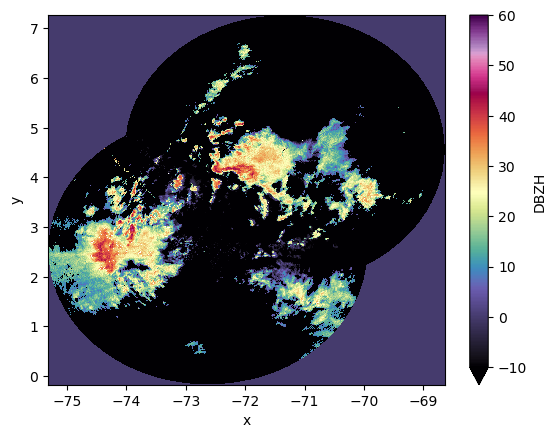

In [19]:
composite.plot(cmap="ChaseSpectral", vmin=-10, vmax=60)

### Map making

In [20]:
map_proj = ccrs.PlateCarree()

In [21]:
from shapely.geometry import Point

def mpl_radar_circle(radar, radius=300000.):
    from matplotlib.patches import Circle
    import cartopy.crs as ccrs
    
    return Circle(
        (radar.ds.longitude.item(), radar.ds.latitude.item()),  # center in degrees
        radius / 111_000,  # convert meters to degrees approx
        edgecolor="red", facecolor="none", alpha=0.5,
        transform=ccrs.PlateCarree(), zorder=3
    )

    
def hv_radar_circle(radar, radius):
    gdf = gpd.GeoDataFrame(geometry=[Point(radar.ds.longitude.values, radar.ds.latitude.values)], crs="EPSG:4326").to_crs("EPSG:32632")
    circle = gdf.geometry.buffer(radius)
    gdf_circle = gpd.GeoDataFrame(geometry=circle, crs="EPSG:4326").to_crs("EPSG:4326")
    return gdf_circle.hvplot().opts(fill_color=None, alpha=0.5)

(-0.17, 7.265000000000001)

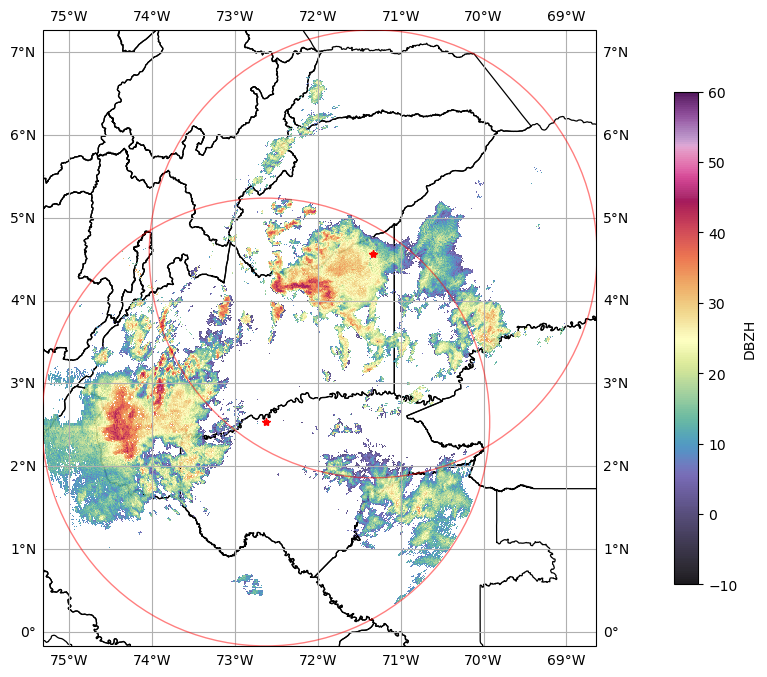

In [22]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection=map_proj)
ax.gridlines(draw_labels=True)
# ax.coastlines(lw=2)

cmap = "ChaseSpectral"

# our rainfall product
composite.where(composite>0.1).plot(ax=ax, cmap=cmap, vmin=-10, vmax=60, cbar_kwargs=dict(shrink=0.8, pad=0.1), alpha=0.9)

# the state borders
borders = cfeature.NaturalEarthFeature(
        category="cultural",
        name="admin_0_boundary_lines_land",
        scale="10m",
        facecolor="none",
    )
# ax.add_feature(borders, edgecolor="black", lw=2, zorder=4)

# Political division
# Shapefile of Colombian departments
shp_path = "/media/alfonso/drive/Alfonso/python/notebooks/data/dptos/Departamentos.shp"
reader = shpreader.Reader(shp_path)
departments = ShapelyFeature(reader.geometries(), ccrs.PlateCarree(), edgecolor="black", facecolor="none", linewidth=0.9)

ax.add_feature(departments, zorder=0)

# # the rivers
# rivers = cfeature.NaturalEarthFeature(
#         category="physical",
#         name="rivers_lake_centerlines",
#         scale="10m",
#         facecolor="none",
#     )
# ax.add_feature(rivers, edgecolor="deepskyblue", lw=1, zorder=4)

# the radars
ax.plot(ctree["CAR"].ds.longitude, ctree["CAR"].ds.latitude, "*r", transform=ccrs.PlateCarree())
ax.add_patch(mpl_radar_circle(ctree["CAR"]))
ax.plot(ctree["GUA"].ds.longitude, ctree["GUA"].ds.latitude, "*r", transform=ccrs.PlateCarree())
ax.add_patch(mpl_radar_circle(ctree["GUA"]))
# set ax limits
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

### dynamic map 

In [23]:

# 1. Generate custom cmap from ChaseSpectral
cmap = plt.get_cmap("ChaseSpectral", 256)
colors = [mcolors.rgb2hex(cmap(i)) for i in range(cmap.N)]

# 2. Load and clean radar composite
composite = radargrids.wrl.comp.compose_weighted(qualitygrids)
composite = composite.rename({'x': 'lon', 'y': 'lat'})

# Ensure 1D coords if originally 2D
if composite.lon.ndim == 2:
    composite = composite.assign_coords(lon=composite.lon[0, :], lat=composite.lat[:, 0])

da = composite.where(composite > 0.0)
lon_min, lon_max = float(da.lon.min()), float(da.lon.max())
lat_min, lat_max = float(da.lat.min()), float(da.lat.max())

# 3. Plot reflectivity without geo=True
rplot = rasterize(
    da.hvplot.image(
        x='lon', y='lat',
        cmap=colors,
        clim=(-10, 60),
        colorbar=True,
        frame_width=600,
        frame_height=550,  
        aspect='equal'
    )
).opts(
    title="Radar Composite with Departments"
)

# 4. Load and clip Colombian department shapefile
shp_path = "/media/alfonso/drive/Alfonso/python/notebooks/data/dptos/Departamentos.shp"
gdf = gpd.read_file(shp_path).to_crs("EPSG:4326")
gdf = gdf[gdf.is_valid]
# 5. Plot departments without geo=True
gdf_layer = gdf.hvplot(
    line_color='black',
    line_width=0.8,
    fill_alpha=0
)
# 6. Compose final overlay with explicit axis limits
overlay = (rplot * gdf_layer).opts(
    xlim=(lon_min, lon_max),
    ylim=(lat_min, lat_max),
    framewise=True,
    axiswise=True
)
# 7. Serve panel
pn.panel(overlay).servable()


HoloViews(DynamicMap, sizing_mode='fixed')

### Sat data

#### functions

In [24]:
def create_query(date, band='C01'):
    """
    Creates a query for listing GOES16 files stored in AWS bucket
    :param date: date to be queried. e.g datetime(2021, 10, 3, 12). Datetime python object
    :param band: Goes16 band to be queried e.g. C01
    :return: string with a
    """
    prefix = f'ABI-L1b-RadF/{date:%Y}/{date.timetuple().tm_yday:03d}/{date:%H}/OR_ABI-L1b-RadF-M6{band}_G19_s' \
             f'{date:%Y}{date.timetuple().tm_yday:03d}*'
    return prefix

def download_s3file(s3_path: str)-> str:
    return fsspec.open_local(
            f"simplecache::s3://{s3_path}",
            s3={"anon": True},
            filecache={"cache_storage": "."},
        )

def get_geocoords(ds):
    """
    Converts Cartesian coordinates (x, y, z) in a radar dataset to geographic
    coordinates (longitude, latitude, altitude) using CRS transformation.

    Parameters
    ----------
    ds : xarray.Dataset
        Radar dataset with Cartesian coordinates.

    Returns
    -------
    xarray.Dataset
        Dataset with added 'lon', 'lat', and 'alt' coordinates and their attributes.
    """
    from pyproj import CRS, Transformer

    # Convert the dataset to georeferenced coordinates
    ds = ds.xradar.georeference()
    # Define source and target coordinate reference systems (CRS)
    src_crs = ds.xradar.get_crs()
    trg_crs = CRS.from_user_input(4326)  # EPSG:4326 (WGS 84)
    # Create a transformer for coordinate conversion
    transformer = Transformer.from_crs(src_crs, trg_crs)
    # Transform x, y, z coordinates to latitude, longitude, and altitude
    trg_y, trg_x, trg_z = transformer.transform(ds.x, ds.y, ds.z)
    # Assign new coordinates with appropriate attributes
    ds = ds.assign_coords(
        {
            "lon": (ds.x.dims, trg_x, xd.model.get_longitude_attrs()),
            "lat": (ds.y.dims, trg_y, xd.model.get_latitude_attrs()),
            "alt": (ds.z.dims, trg_z, xd.model.get_altitude_attrs()),
        }
    )
    return ds
    

def calc_latlon(ds):
    x = ds.x.values
    y = ds.y.values
    goes_imager_projection = ds.goes_imager_projection

    X, Y = np.meshgrid(x, y)

    r_eq = goes_imager_projection.attrs["semi_major_axis"]
    r_pol = goes_imager_projection.attrs["semi_minor_axis"]
    l_0 = goes_imager_projection.attrs["longitude_of_projection_origin"] * (np.pi / 180)
    h_sat = goes_imager_projection.attrs["perspective_point_height"]
    H = r_eq + h_sat

    a = np.sin(X) ** 2 + (np.cos(X) ** 2 * (np.cos(Y) ** 2 + (r_eq ** 2 / r_pol ** 2) * np.sin(Y) ** 2))
    b = -2 * H * np.cos(X) * np.cos(Y)
    c = H ** 2 - r_eq ** 2

    r_s = (-b - np.sqrt(b ** 2 - 4 * a * c)) / (2 * a)

    s_x = r_s * np.cos(X) * np.cos(Y)
    s_y = -r_s * np.sin(X)
    s_z = r_s * np.cos(X) * np.sin(Y)

    lat = np.arctan((r_eq ** 2 / r_pol ** 2) * (s_z / np.sqrt((H - s_x) ** 2 + s_y ** 2))) * (180 / np.pi)
    lon = (l_0 - np.arctan(s_y / (H - s_x))) * (180 / np.pi)

    # Keep full 2D lat/lon as coordinates
    ds = ds.assign_coords({
        "latitude": (("y", "x"), lat),
        "longitude": (("y", "x"), lon)
    })

    return ds



def get_xy_from_latlon(ds, lats, lons):
    lat1, lat2 = lats
    lon1, lon2 = lons

    lat = ds.latitude.values
    lon = ds.longitude.values

    x = ds.x.values
    y = ds.y.values

    X, Y = np.meshgrid(x, y)

    mask = (lat >= lat1) & (lat <= lat2) & (lon >= lon1) & (lon <= lon2)

    if not np.any(mask):
        raise ValueError("No matching lat/lon values found.")

    x_filtered = X[mask]
    y_filtered = Y[mask]

    return ((np.nanmin(x_filtered), np.nanmax(x_filtered)),
            (np.nanmin(y_filtered), np.nanmax(y_filtered)))



def normalization(da, vmin, vmax, gamma):
    norm = (da - vmin) / (vmax - vmin)
    norm = np.clip(norm, 0, 1)
    return np.power(norm, gamma)


def rad2tb(ds):
        """
        https://www.star.nesdis.noaa.gov/goesr/docs/ATBD/Imagery.pdf pag 22
        """
        fk1 = ds['planck_fk1']
        fk2 = ds['planck_fk2']
        bc1 = ds['planck_bc1']
        bc2 = ds['planck_bc2']
        bt = ((fk2 / (np.log((fk1 / ds.Rad) + 1))) - bc1) / bc2
        return bt

def loadCPT(path):

    try:
        f = open(path)
    except:
        print ("File ", path, "not found")
        return None

    lines = f.readlines()

    f.close()

    x = np.array([])
    r = np.array([])
    g = np.array([])
    b = np.array([])

    colorModel = 'RGB'

    for l in lines:
        ls = l.split()
        if l[0] == '#':
            if ls[-1] == 'HSV':
                colorModel = 'HSV'
                continue
            else:
                continue
        if ls[0] == 'B' or ls[0] == 'F' or ls[0] == 'N':
            pass
        else:
            x=np.append(x,float(ls[0]))
            r=np.append(r,float(ls[1]))
            g=np.append(g,float(ls[2]))
            b=np.append(b,float(ls[3]))
            xtemp = float(ls[4])
            rtemp = float(ls[5])
            gtemp = float(ls[6])
            btemp = float(ls[7])

        x=np.append(x,xtemp)
        r=np.append(r,rtemp)
        g=np.append(g,gtemp)
        b=np.append(b,btemp)

    if colorModel == 'HSV':
        for i in range(r.shape[0]):
            rr, gg, bb = colorsys.hsv_to_rgb(r[i]/360.,g[i],b[i])
        r[i] = rr ; g[i] = gg ; b[i] = bb

    if colorModel == 'RGB':
        r = r/255.0
        g = g/255.0
        b = b/255.0

    xNorm = (x - x[0])/(x[-1] - x[0])

    red   = []
    blue  = []
    green = []

    for i in range(len(x)):
        red.append([xNorm[i],r[i],r[i]])
        green.append([xNorm[i],g[i],g[i]])
        blue.append([xNorm[i],b[i],b[i]])

    colorDict = {'red': red, 'green': green, 'blue': blue}

    return colorDict

#### data

In [25]:
dt = datetime(2025, 4, 2, 13, 10, 4)  # Match your original timestamp
query = create_query(dt, band="C13")

goes_files =  ['s3://' + f for f in
              # sorted(fs.glob(f"s3://noaa-goes19/ABI-L1b-RadF/2025/092/13/*"))
              sorted(fs.glob(f"s3://noaa-goes19/{query}"))
             ]

In [26]:
ds_goes = xr.open_dataset(
    download_s3file(goes_files[1]), 
    chunks={'x': 512, 'y': 512},
)

ds_goes = calc_latlon(ds_goes)

lat_bounds = (1.8, 7.3)
lon_bounds = (-74.1, -68.6)

(x_min, x_max), (y_min, y_max) = get_xy_from_latlon(ds_goes, lat_bounds, lon_bounds)

# Crop GOES to this extent in native projection
ds_goes_crop = ds_goes.sel(
    x=slice(x_min, x_max),
    y=slice(y_max, y_min)
)

#### dynamic plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
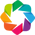

HoloViews(DynamicMap, height=550, sizing_mode='fixed', width=600)

In [27]:

hv.extension('bokeh')
pn.extension()

# 1. Load and prepare colormap
cpt_path = '/media/alfonso/drive/Alfonso/python/notebooks/data/IR4AVHRR6.cpt'
color_dict = loadCPT(cpt_path)
cmap = mcolors.LinearSegmentedColormap('CustomCPT', color_dict)
hex_colors = [mcolors.rgb2hex(cmap(i)) for i in np.linspace(0, 1, 256)]

# 2. Prepare data
rad_da = rad2tb(ds_goes_crop) - 273.15
da_plot = rad_da.assign_coords(
    lon=rad_da.longitude.rename('lon'),
    lat=rad_da.latitude.rename('lat')
).chunk({'x': -1, 'y': -1})

# 3. Create QuadMesh element directly
quadmesh = hv.QuadMesh((da_plot.lon, da_plot.lat, da_plot))

# 4. Apply custom styling
sat_plot = rasterize(quadmesh).opts(
    cmap=hex_colors,
    clim=(-100, 90),
    colorbar=True,
    colorbar_opts={'title': 'Temp (°C)'},
    title="Brightness Temperature (°C)",
    tools=['hover'],
    width=600,
    height=550,
    aspect='equal'
)

# 5. Add shapefile overlay
gdf = gpd.read_file("/media/alfonso/drive/Alfonso/python/notebooks/data/dptos/Departamentos.shp")
gdf_layer = gdf.hvplot(line_color='black', line_width=0.8, fill_alpha=0)

# 6. Compose final plot
overlay = (sat_plot * gdf_layer).opts(
    xlim=(float(da_plot.lon.min()), float(da_plot.lon.max())),
    ylim=(float(da_plot.lat.min()), float(da_plot.lat.max())),
    toolbar='above'
)

pn.panel(overlay).servable()

### Radar + sat Comparison

#### working but error

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
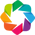

Column(css_classes=['dashboard'], sizing_mode='stretch_width')
    [0] Row
        [0] Column
            [0] Markdown(str)
            [1] FloatSlider(bar_color='#ff0000', end=-68.64000000000607, name='Data View', start=-74.0902758109658, step=0.05450275810959738, value=-71.36513790548594)
            [2] Str(str, width=400)
    [1] ParamFunction(function, _pane=HoloViews, defer_load=False)

In [39]:
import panel as pn
import holoviews as hv
import geopandas as gpd
from holoviews.operation.datashader import rasterize
import xarray as xr
import numpy as np

hv.extension('bokeh')
pn.extension()

# ----------------------------
# Common Components
# ----------------------------
# Shared shapefile
shp_path = "/media/alfonso/drive/Alfonso/python/notebooks/data/dptos/Departamentos.shp"
gdf = gpd.read_file(shp_path).to_crs("EPSG:4326")
gdf_layer = gdf.hvplot(line_color='black', line_width=0.8, fill_alpha=0)

# Define common plot dimensions
PLOT_WIDTH = 800
PLOT_HEIGHT = 600

# ----------------------------
# Prepare Data
# ----------------------------
# Radar data
composite = radargrids.wrl.comp.compose_weighted(qualitygrids).rename({'x': 'lon', 'y': 'lat'})
if composite.lon.ndim == 2:
    composite = composite.assign_coords(lon=composite.lon[0,:], lat=composite.lat[:,0])
da_radar = composite.where(composite > 0)

# Satellite data
da_sat = rad2tb(ds_goes_crop) - 273.15  # Convert to Celsius
if 'latitude' in da_sat.coords and 'longitude' in da_sat.coords:
    da_sat = da_sat.rename({'latitude': 'lat', 'longitude': 'lon'})

# Find common bounds
lon_min = max(float(da_radar.lon.min()), float(da_sat.lon.min()))
lon_max = min(float(da_radar.lon.max()), float(da_sat.lon.max()))
lat_min = max(float(da_radar.lat.min()), float(da_sat.lat.min()))
lat_max = min(float(da_radar.lat.max()), float(da_sat.lat.max()))

# Create slider
split_slider = pn.widgets.FloatSlider(
    name='Data View', 
    start=lon_min, 
    end=lon_max, 
    value=(lon_min + lon_max)/2,
    step=(lon_max - lon_min)/100,
    bar_color='#ff0000'
)

# ----------------------------
# Combined Plot
# ----------------------------
def create_combined_plot(split_lon):
    # Create radar plot clipped to left of slider
    radar_left = da_radar.where(da_radar.lon <= split_lon)
    radar_plot = rasterize(
        radar_left.hvplot.image(
            x='lon', y='lat',
            cmap=colors,
            clim=(-10, 60),
            colorbar=True,
            title="Radar (left) vs Satellite (right)"
        )
    ).opts(
        xlim=(lon_min, lon_max),
        ylim=(lat_min, lat_max),
        width=600,
        height=550,
    )
    
    # Create satellite plot clipped to right of slider
    sat_right = da_sat.where(da_sat.lon >= split_lon)
    sat_quad = hv.QuadMesh((sat_right.lon, sat_right.lat, sat_right))
    sat_plot = rasterize(sat_quad).opts(
            cmap=hex_colors,
            clim=(-100, 90),
            colorbar=True,
            colorbar_opts={'title': 'Temp (°C)'},
            title="Brightness Temperature (°C)",
        )
    
    # Combine plots and add shapefile
    combined = (radar_plot * sat_plot * gdf_layer).opts(
        width=PLOT_WIDTH,
        height=PLOT_HEIGHT,
        aspect='equal',
        toolbar='above'
    )
    
    # Add vertical line at split position
    split_line = hv.VLine(split_lon).opts(
        line_color='red', 
        line_width=2, 
        line_dash='dashed'
    )
    
    return combined * split_line

# Coordinate display
coord_display = pn.pane.Str("Hover over the plot to see coordinates", width=400)

# Update function for slider
# def update_plot(event):
#     if event.new == event.old:
#         return
#     new_plot = create_combined_plot(event.new)
#     combined_pane.object = new_plot.opts(hooks=[setup_hover])

# # Create the initial plot
# combined_plot = create_combined_plot(split_slider.value)
# hover_stream = hv.streams.PointerXY(source=combined_plot)
# hover_stream.add_subscriber(update_plot)

# interactive_plot = pn.bind(create_combined_plot, split_lon=split_slider)
split_slider.throttled = True
interactive_plot = pn.bind(create_combined_plot, split_lon=split_slider)


# Link slider to plot
interactive_plot = pn.bind(create_combined_plot, split_lon=split_slider)

# # Add description
# description = pn.pane.Markdown("""
# **Instructions:**  
# - Drag the slider to adjust the split between radar (left) and satellite (right) data  
# - The red dashed line shows the current split position  
# - Hover over the plot to see coordinates  
# """)

# Assemble dashboard
dashboard = pn.Column(
    pn.Row(
        pn.Column(
            "## Radar and Satellite Combined View",
            # description,
            split_slider,
            coord_display,
            # align='center'
        ),
        # align='center'
    ),
    interactive_plot,
    sizing_mode='stretch_width', 
    css_classes=['dashboard']
)

# Add styling
pn.config.raw_css.append("""
.dashboard {
    padding: 20px;
    border-radius: 5px;
    background: #f5f5f5;
}
""")

# Serve the dashboard
dashboard.servable()